# Analyzing New Solar Events with the Model

This notebook allows to analyze specific solar events. Users can input a **date**, **location** on the Sun and **duration**. The notebook then generates a complete animation showcasing the solar region, and a prediction and localisation whether a solar jet is present in the observed area.







In [2]:
import argparse
import datetime
import json
import random
import time
from pathlib import Path
import warnings
import math

import numpy as np
import torch
from torch.utils.data import DataLoader
import torchvision

#Model
from torch.nn.init import xavier_uniform_, constant_, uniform_, normal_
from torch import nn, Tensor
import torch.nn.functional as F
from torchvision.transforms import functional
import copy
from torch.autograd import Function
from torch.autograd.function import once_differentiable

import MultiScaleDeformableAttention as MSDA


import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Rectangle
from IPython.display import HTML
import os
import sys
import matplotlib
from util.misc_multi import nested_tensor_from_tensor_list
import PIL
from PIL import Image
from typing import Optional

import io
import contextlib
import astropy.units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time
from astropy.io import fits
from astropy.visualization import ImageNormalize, SqrtStretch

import sunpy.coordinates  # NOQA
import sunpy.map
from sunpy.net import Fido
from sunpy.net import attrs as attrs

import torch

from sunpy.net import jsoc

from PIL import Image

c:\Users\adrie\anaconda3\envs\ML\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<div style="width: 1350px; height: 30px; background-color: green;"></div>


# 0. Inputs of Event

In [3]:
basepoint_x = -226.577125
basepoint_y = -256.964375
start_time = '2016-07-09T06:55:58'
end_time = '2016-07-09T07:05:58'

jsoc_email = 'adrien.joliat@epfl.ch'

threshold=0.25       # How certain we want to be to predict a jet event

# cadence (24s per image)

<div style="width: 1350px; height: 30px; background-color: green;"></div>


# 1. Create Input to the Model

## Image Classification Model Requirements

### Image Sequence Requirements:
- **Time Interval:** Each image should be captured at intervals of 24 seconds. While the model can handle varying intervals, it has been trained for the 24-second interval at 304 Angstrom. Deviations might result in reduced accuracy.

### Image Size and Format:
- **Processed Image :** Before feeding them to the model, these images are transformed from numpy arrays into JPEG images.

In [4]:
def array_to_rgb_jpeg(array, cmap, output_path):
    
    vmin, vmax = np.percentile(array, [1, 99.9])

    # Normalize the array
    norm = ImageNormalize(vmin=vmin, vmax=vmax, stretch=SqrtStretch())
    
    # Apply the colormap to the array to get RGB representation
    cmap_image = plt.get_cmap(cmap)(norm(array))[:, :, :3]  # [:, :, :3] to remove alpha channel
    
    # Convert the RGB array to a PIL Image
    img = Image.fromarray((cmap_image * 255).astype(np.uint8))

    # Save the image as JPEG
    img.save(output_path, "JPEG", quality=100)


def get_event_images(coord, jet_start_time, jet_end_time, height=120):
    """
    Inputs:
        coord=list[latitude,longitude of coordinates of the desired area]
        height=height of the wanted image (in )
    """
    data_path = f'./new_data/{str(jet_start_time)}'.replace("-","_").replace(":","_")
    if not os.path.exists(data_path): os.mkdir(data_path)
    
    cutout_half_side = height/2#60 if jet_box.height.value < 60 else jet_box.height.value + 20

    x1 = coord[0] - cutout_half_side
    x2 = coord[0] + cutout_half_side
    y1 = coord[1] - cutout_half_side
    y2 = coord[1] + cutout_half_side
    bottom_left = SkyCoord(x1*u.arcsec, y1*u.arcsec, obstime=jet_start_time, observer="earth", frame="helioprojective")
    top_right = SkyCoord(x2*u.arcsec, y2*u.arcsec, obstime=jet_start_time, observer="earth", frame="helioprojective")
    cutout = attrs.jsoc.Cutout(bottom_left, top_right=top_right, tracking=False)

    ############################################################################################
    #Request data with JSOC Client and Save JPEG images locally (images_events_jet/jetid_number)
    ############################################################################################

    client = jsoc.JSOCClient()
    query = client.search(
        attrs.Time(jet_start_time, jet_end_time),
        attrs.Wavelength(304*u.angstrom),
        attrs.Sample(24*u.s),
        attrs.jsoc.Series.aia_lev1_euv_12s,
        attrs.jsoc.Notify(jsoc_email),
        attrs.jsoc.Segment.image,
        cutout,
    )
    #print(query)

    request=client.request_data(query)
    request.wait()
    res = client.get_request(request, path=data_path, overwrite=True) 
    res.sort()

    if len(res.errors)>0: #if there is an error while downloading the jet id
        print(f"ERROR WHILE GETTING THE DATA") 
    else:
        output_path_fold=data_path
        if not os.path.exists(output_path_fold): os.mkdir(output_path_fold)
        for i in range(len(res)):
            with fits.open(res[i]) as f:
                array = (f[1].data).astype(np.float32)
                #have to reverse column to store the same image
                array_to_rgb_jpeg(array[::-1,:], cmap="sdoaia304", output_path=data_path+f"/{str(i).zfill(4)}.JPEG")
               
            os.remove(res[i]) # We don't want to store the files in the computer. Delete them (they take A LOT of storage otherwise)


## Download Images 

In [5]:
coord=[basepoint_x,basepoint_y]
get_event_images(coord, start_time, end_time, height=400)

2024-06-04 19:09:20 - drms - INFO: Export request pending. [id=JSOC_20240604_001301, status=2]
2024-06-04 19:09:20 - drms - INFO: Waiting for 5 seconds...


26 URLs found for download. Full request totalling 6MB


Files Downloaded: 100%|██████████| 26/26 [01:25<00:00,  3.29s/file]


# 2. Visualize Image

May it contain a jet?

# 3. Evaluate the Image Video with the Model


In [6]:
def get_args_parser():
    parser = argparse.ArgumentParser('Deformable DETR Detector', add_help=False)
    parser.add_argument('--lr', default=2e-4, type=float)
    parser.add_argument('--lr_backbone_names', default=["backbone.0"], type=str, nargs='+')
    parser.add_argument('--lr_backbone', default=2e-5, type=float)
    parser.add_argument('--lr_linear_proj_names', default=['reference_points', 'sampling_offsets'], type=str, nargs='+')
    parser.add_argument('--lr_linear_proj_mult', default=0.1, type=float)
    parser.add_argument('--batch_size', default=2, type=int)
    parser.add_argument('--weight_decay', default=1e-4, type=float)
    parser.add_argument('--epochs', default=15, type=int)
    parser.add_argument('--lr_drop', default=5, type=int)
    parser.add_argument('--lr_drop_epochs', default=None, type=int, nargs='+')
    parser.add_argument('--clip_max_norm', default=0.1, type=float,
                        help='gradient clipping max norm')
    
    parser.add_argument('--num_ref_frames', default=3, type=int, help='number of reference frames')
    parser.add_argument('--num_frames', default=4, type=int, help='number of reference frames')

    parser.add_argument('--sgd', action='store_true')
    parser.add_argument('--gap', default = 2, type = int )
    # Variants of Deformable DETR
    parser.add_argument('--with_box_refine', default=False, action='store_true')
    parser.add_argument('--two_stage', default=False, action='store_true')

    # Model parameters
    parser.add_argument('--frozen_weights', type=str, default=None,
                        help="Path to the pretrained model. If set, only the mask head will be trained")
    parser.add_argument('--pretrained', default=None, help='resume from checkpoint')
    
    # * Backbone
    parser.add_argument('--backbone', default='resnet50', type=str,
                        help="Name of the convolutional backbone to use")
    parser.add_argument('--dilation', action='store_true',
                        help="If true, we replace stride with dilation in the last convolutional block (DC5)")
    parser.add_argument('--position_embedding', default='sine', type=str, choices=('sine', 'learned'),
                        help="Type of positional embedding to use on top of the image features")
    parser.add_argument('--position_embedding_scale', default=2 * np.pi, type=float,
                        help="position / size * scale")
    parser.add_argument('--num_feature_levels', default=4, type=int, help='number of feature levels')
    parser.add_argument('--checkpoint', default=False, action='store_true')

    # * Transformer
    parser.add_argument('--enc_layers', default=6, type=int,
                        help="Number of encoding layers in the transformer")
    parser.add_argument('--dec_layers', default=6, type=int,
                        help="Number of decoding layers in the transformer")
    parser.add_argument('--dim_feedforward', default=1024, type=int,
                        help="Intermediate size of the feedforward layers in the transformer blocks")
    parser.add_argument('--hidden_dim', default=256, type=int,
                        help="Size of the embeddings (dimension of the transformer)")
    parser.add_argument('--dropout', default=0.1, type=float,
                        help="Dropout applied in the transformer")
    parser.add_argument('--nheads', default=8, type=int,
                        help="Number of attention heads inside the transformer's attentions")
    parser.add_argument('--num_queries', default=300, type=int,
                        help="Number of query slots")
    parser.add_argument('--dec_n_points', default=4, type=int)
    parser.add_argument('--enc_n_points', default=4, type=int)
    parser.add_argument('--n_temporal_decoder_layers', default=1, type=int)
    parser.add_argument('--interval1', default=20, type=int)
    parser.add_argument('--interval2', default=60, type=int)

    parser.add_argument("--fixed_pretrained_model", default=False, action='store_true')
    parser.add_argument("--is_shuffle", default=False, action='store_true')
    
    # * Segmentation
    parser.add_argument('--masks', action='store_true',
                        help="Train segmentation head if the flag is provided")

    # Loss
    parser.add_argument('--no_aux_loss', dest='aux_loss', action='store_false',
                        help="Disables auxiliary decoding losses (loss at each layer)")

    # * Matcher
    parser.add_argument('--set_cost_class', default=2, type=float,
                        help="Class coefficient in the matching cost")
    parser.add_argument('--set_cost_bbox', default=5, type=float,
                        help="L1 box coefficient in the matching cost")
    parser.add_argument('--set_cost_giou', default=2, type=float,
                        help="giou box coefficient in the matching cost")

    # * Loss coefficients
    parser.add_argument('--mask_loss_coef', default=1, type=float)
    parser.add_argument('--dice_loss_coef', default=1, type=float)
    parser.add_argument('--cls_loss_coef', default=2, type=float)
    parser.add_argument('--bbox_loss_coef', default=5, type=float)
    parser.add_argument('--giou_loss_coef', default=2, type=float)
    parser.add_argument('--focal_alpha', default=0.25, type=float)

    # dataset parameters
    parser.add_argument('--dataset_file', default='vid_multi')
    parser.add_argument('--coco_path', default='./data/coco', type=str)
    parser.add_argument('--vid_path', default='./data/vid', type=str)
    parser.add_argument('--coco_pretrain', default=False, action='store_true')
    parser.add_argument('--coco_panoptic_path', type=str)
    parser.add_argument('--remove_difficult', action='store_true')

    parser.add_argument('--output_dir', default='',
                        help='path where to save, empty for no saving')
    parser.add_argument('--device', default='cuda',
                        help='device to use for training / testing')
    parser.add_argument('--seed', default=42, type=int)
    parser.add_argument('--resume', default='', help='resume from checkpoint')
    parser.add_argument('--start_epoch', default=0, type=int, metavar='N',
                        help='start epoch')
    parser.add_argument('--eval', action='store_true')
    parser.add_argument('--num_workers', default=0, type=int)
    parser.add_argument('--cache_mode', default=False, action='store_true', help='whether to cache images on memory')

    return parser

parser=get_args_parser()
args=parser.parse_args(["--with_box_refine",
                        "--num_frames","12",
                        "--resume", "./exps/multi_model_jet//FINAL/checkpoint0004.pth", #/FINAL_PROJECT_train4/checkpoint0007
                        "--backbone", "swin_b_p4w7",
                        "--num_feature_levels", "1",
                        "--num_queries", "100",
                        "--hidden_dim", "256",
                        "--num_queries", "100",
                        "--dilation",
                        "--batch_size", "1",
                        "--eval"
                        ])

import util.misc_multi as utils
from models import build_model

device = torch.device(args.device)

model, criterion, postprocessors = build_model(args)
model.to(device)
model_without_ddp = model
n_parameters = sum(p.numel() for p in model.parameters() if p.requires_grad)
print('number of params:', n_parameters)

# lr_backbone_names = ["backbone.0", "backbone.neck", "input_proj", "transformer.encoder"]
def match_name_keywords(n, name_keywords):
    out = False
    for b in name_keywords:
        if b in n:
            out = True
            break
    return out

for n, p in model_without_ddp.named_parameters():
    print(n)

param_dicts = [
        {
            "params":
                [p for n, p in model_without_ddp.named_parameters()
                 if not match_name_keywords(n, args.lr_backbone_names) and not match_name_keywords(n, args.lr_linear_proj_names) and p.requires_grad],
            "lr": args.lr,
        },
        {
            "params": [p for n, p in model_without_ddp.named_parameters() if match_name_keywords(n, args.lr_backbone_names) and p.requires_grad],
            "lr": args.lr_backbone,
        },
        {
            "params": [p for n, p in model_without_ddp.named_parameters() if match_name_keywords(n, args.lr_linear_proj_names) and p.requires_grad],
            "lr": args.lr * args.lr_linear_proj_mult,
        }
    ]


if args.resume:
    checkpoint = torch.load(args.resume, map_location='cpu')
    model_without_ddp.load_state_dict(checkpoint['model'], strict=False) 

class NestedTensor(object):
    def __init__(self, tensors, mask: Optional[Tensor]):
        self.tensors = tensors
        self.mask = mask

    def to(self, device, non_blocking=False):
      
        cast_tensor = self.tensors.to(device, non_blocking=non_blocking)
        mask = self.mask
        if mask is not None:
            assert mask is not None
            cast_mask = mask.to(device, non_blocking=non_blocking)
        else:
            cast_mask = None
        return NestedTensor(cast_tensor, cast_mask)

    def record_stream(self, *args, **kwargs):
        self.tensors.record_stream(*args, **kwargs)
        if self.mask is not None:
            self.mask.record_stream(*args, **kwargs)

    def decompose(self):
        return self.tensors, self.mask

    def __repr__(self):
        return str(self.tensors)
    
def get_files_in_folder(folder_path):
    files = []
    for file_name in os.listdir(folder_path):
        file_path = os.path.join(folder_path, file_name)
        if os.path.isfile(file_path):
            files.append(file_path)
    return files

def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(-1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=-1)



def resize(clip, target, size, max_size=None):
    # size can be min_size (scalar) or (w, h) tuple

    def get_size_with_aspect_ratio(image_size, size, max_size=None):
        w, h = image_size
        if max_size is not None:
            min_original_size = float(min((w, h)))
            max_original_size = float(max((w, h)))
            if max_original_size / min_original_size * size > max_size:
                size = int(round(max_size * min_original_size / max_original_size))

        if (w <= h and w == size) or (h <= w and h == size):
            return (h, w)

        if w < h:
            ow = size
            oh = int(size * h / w)
        else:
            oh = size
            ow = int(size * w / h)

        return (oh, ow)

    def get_size(image_size, size, max_size=None):
        if isinstance(size, (list, tuple)):
            return size[::-1]
        else:
            return get_size_with_aspect_ratio(image_size, size, max_size)

    size = get_size(clip[0].size, size, max_size)
    rescaled_image = []
    for image in clip:
        rescaled_image.append(functional.resize(image, size))

    if target is None: 
        return rescaled_image, None

    ratios = tuple(float(s) / float(s_orig) for s, s_orig in zip(rescaled_image[0].size, clip[0].size))
    ratio_width, ratio_height = ratios


    
    targets = target.copy()
    for target in targets:
        if "boxes" in target:
            boxes = target["boxes"]
            scaled_boxes = boxes * torch.as_tensor([ratio_width, ratio_height, ratio_width, ratio_height])
            target["boxes"] = scaled_boxes

        if "area" in target:
            area = target["area"]
            scaled_area = area * (ratio_width * ratio_height)
            target["area"] = scaled_area

        h, w = size
        target["size"] = torch.tensor([h, w])

    return rescaled_image, targets

class RandomResize(object):
    def __init__(self, sizes, max_size=None):
        assert isinstance(sizes, (list, tuple))
        self.sizes = sizes
        self.max_size = max_size

    def __call__(self, img, target=None):
        size = random.choice(self.sizes)
        return resize(img, target, size, self.max_size)
    
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

    def __repr__(self):
        format_string = self.__class__.__name__ + "("
        for t in self.transforms:
            format_string += "\n"
            format_string += "    {0}".format(t)
        format_string += "\n)"
        return format_string
    
def box_xyxy_to_cxcywh(x):
    x0, y0, x1, y1 = x.unbind(-1)
    b = [(x0 + x1) / 2, (y0 + y1) / 2,
         (x1 - x0), (y1 - y0)]
    return torch.stack(b, dim=-1) 

class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, clip, target=None):
        image = []
        for im in clip:
            image.append(functional.normalize(im, mean=self.mean, std=self.std))
        if target is None:
            return image, None
        targets = target.copy()
        for i, target in enumerate(targets):
            h, w = image[i].shape[-2:]
            if "boxes" in target:
                boxes = target["boxes"]
                boxes = box_xyxy_to_cxcywh(boxes)
                boxes = boxes / torch.tensor([w, h, w, h], dtype=torch.float32)
                target["boxes"] = boxes
        return image, targets

class ToTensor(object):
    def __call__(self, clip, target):
        img = []
        for im in clip:
            img.append(functional.to_tensor(im))
        return img, target
        

self.num_layers 4


c:\Users\adrie\anaconda3\envs\ML\Lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


number of params: 106274744
transformer.level_embed
transformer.encoder.layers.0.self_attn.sampling_offsets.weight
transformer.encoder.layers.0.self_attn.sampling_offsets.bias
transformer.encoder.layers.0.self_attn.attention_weights.weight
transformer.encoder.layers.0.self_attn.attention_weights.bias
transformer.encoder.layers.0.self_attn.value_proj.weight
transformer.encoder.layers.0.self_attn.value_proj.bias
transformer.encoder.layers.0.self_attn.output_proj.weight
transformer.encoder.layers.0.self_attn.output_proj.bias
transformer.encoder.layers.0.norm1.weight
transformer.encoder.layers.0.norm1.bias
transformer.encoder.layers.0.linear1.weight
transformer.encoder.layers.0.linear1.bias
transformer.encoder.layers.0.linear2.weight
transformer.encoder.layers.0.linear2.bias
transformer.encoder.layers.0.norm2.weight
transformer.encoder.layers.0.norm2.bias
transformer.encoder.layers.1.self_attn.sampling_offsets.weight
transformer.encoder.layers.1.self_attn.sampling_offsets.bias
transformer.

In [7]:
matplotlib.rcParams['animation.embed_limit'] = 100  # Set to a larger value (in MB)

def main_plot(event, threshold):

    data_path = f'./new_data/{str(start_time)}'.replace("-","_").replace(":","_")
    images=sorted(get_files_in_folder(data_path+"/"))

    num_frames_vid=len(images) 
    print("Number of frames : ", num_frames_vid)
    num_complete_run=num_frames_vid//args.num_frames #12
    num_uncomp_run=num_frames_vid-num_complete_run*args.num_frames #1
    last_run=args.num_frames-num_uncomp_run #11

    normalize = Compose([
            ToTensor(),
            Normalize([0.425, 0.044, 0.012], [0.210, 0.106, 0.052]) #Calculated on the Jet Dataset
        ])
    transform = Compose([
                RandomResize([600], max_size=1000), #Each images will be resized to a 600x600 image
                normalize,
            ])

    model.eval()
    final_bbox=[]
    final_scores=[]
    for i in range(num_complete_run): #For each complete run : transf num_frame images into the input nested tensor
        in_images=images[i*args.num_frames:(i+1)*args.num_frames]
        imgs=[]
        for i,image_path in enumerate(in_images):
            
            img= Image.open(image_path).convert('RGB')
            if i == 0:
                w,h=img.size

            imgs.append(img)
        inputs, _=transform(imgs, None)
        
        inputs=nested_tensor_from_tensor_list(inputs)
        inputs=inputs.to(device)
        
        with torch.no_grad(): 
            outputs = model(inputs) #Here are the output from full events 
            #print(outputs)



        target_sizes = torch.tensor([w, h])
        target_sizes = target_sizes.repeat(args.num_frames,1)

        out_logits, out_bbox = outputs['pred_logits'].detach().cpu(), outputs['pred_boxes'].detach().cpu()
        assert len(out_logits) == len(target_sizes)
        assert target_sizes.shape[1] == 2
        prob = out_logits.sigmoid()
        topk_values, topk_indexes = torch.topk(prob.view(out_logits.shape[0], -1), 100, dim=1)
        scores = topk_values
        topk_boxes = topk_indexes // out_logits.shape[2]
        labels = topk_indexes % out_logits.shape[2]
        boxes = box_cxcywh_to_xyxy(out_bbox)
        boxes = torch.gather(boxes, 1, topk_boxes.unsqueeze(-1).repeat(1,1,4))

        # and from relative [0, 1] to absolute [0, height] coordinates
        img_h, img_w = target_sizes.unbind(1)
        scale_fct = torch.stack([img_w, img_h, img_w, img_h], dim=1)
        boxes = boxes * scale_fct[:, None, :]
        results = [{'scores': s, 'labels': l, 'boxes': b} for s, l, b in zip(scores, labels, boxes)]

        
        for results_im in results: #will be executed num_frames times
            bbox_im=[]
            scores_im=[]
            while results_im["scores"][0]>threshold:
                bbox_im.append(results_im["boxes"][0].tolist())
                scores_im.append(results_im["scores"][0].tolist())
                results_im["boxes"]=results_im["boxes"][1:]
                results_im["scores"]=results_im["scores"][1:]
            final_bbox.append(bbox_im)
            final_scores.append(scores_im)
                
    #last run :

    if last_run==args.num_frames:
        pass
    else:
        in_images=in_images[-last_run:] #we take the images that are already been taken 
        in_images.extend(images[-num_uncomp_run:]) #we complete with the end of the images of the video
        imgs=[]
        for i,image_path in enumerate(in_images):
                
            img= Image.open(image_path).convert('RGB')
            imgs.append(img)

        inputs, _=transform(imgs, None)
            
        inputs=nested_tensor_from_tensor_list(inputs)
        inputs=inputs.to(device)
            
        with torch.no_grad(): 
            outputs = model(inputs) #Here are the output from full events 
            #print(outputs)



        target_sizes = torch.tensor([w, h])
        target_sizes = target_sizes.repeat(args.num_frames,1)

        out_logits, out_bbox = outputs['pred_logits'].detach().cpu(), outputs['pred_boxes'].detach().cpu()
        #assert len(out_logits) == len(target_sizes)
        #assert target_sizes.shape[1] == 2
        prob = out_logits.sigmoid()
        topk_values, topk_indexes = torch.topk(prob.view(out_logits.shape[0], -1), 100, dim=1)
        scores = topk_values
        topk_boxes = topk_indexes // out_logits.shape[2]
        labels = topk_indexes % out_logits.shape[2]
        boxes = box_cxcywh_to_xyxy(out_bbox)
        boxes = torch.gather(boxes, 1, topk_boxes.unsqueeze(-1).repeat(1,1,4))

        # and from relative [0, 1] to absolute [0, height] coordinates, depending on image size
        img_h, img_w = target_sizes.unbind(1)
        scale_fct = torch.stack([img_w, img_h, img_w, img_h], dim=1)
        #print(boxes)
        boxes = boxes * scale_fct[:, None, :]
        #print(boxes)
        results = [{'scores': s, 'labels': l, 'boxes': b} for s, l, b in zip(scores, labels, boxes)]

            
        for i,results_im in enumerate(results): #will be executed num_frames times
            bbox_im=[]
            scores_im=[]
            if i > last_run-1:
                while results_im["scores"][0]>threshold:
                    bbox_im.append(results_im["boxes"][0].tolist())
                    scores_im.append(results_im["scores"][0].tolist())
                    results_im["boxes"]=results_im["boxes"][1:]
                    results_im["scores"]=results_im["scores"][1:]
                final_bbox.append(bbox_im)
                final_scores.append(scores_im)
                    
        #print(len(final_bbox)) #should be equal to the number of frames
        #print(len(final_scores))


    print(len(final_bbox))
    folder_path = data_path
    file_names = sorted(os.listdir(folder_path))

    def read_image_with_bbox(bbox):

        # Read bounding box coordinates (replace with your actual values)
        x_min, y_min = bbox[0], bbox[1]
        x_max, y_max = bbox[2], bbox[3]

        # Calculate rectangle width and height
        width = x_max - x_min
        height = y_max - y_min

        return x_min, y_min, width, height

    def update(frame):
        # Read image and bounding box for the current frame
        image_file = file_names[frame]
        image_path = os.path.join(folder_path, image_file)
        image = plt.imread(image_path)
        ax.set_title(f"{start_time}")
        # Update the image with the loaded image
        im.set_data(image)

        for rect in rects:
            rect.remove()

        for text in texts:
            text.remove()


        # Create new rectangles
        rects.clear()  # Clear the list of rectangles
        texts.clear()


        for a,bbox in enumerate(final_bbox[frame]):
            x_min, y_min, width, height = read_image_with_bbox(bbox)
            rect_params = {
                'xy': (x_min, y_min),
                'width': width,
                'height': height,
                'linewidth': 1,
                'edgecolor': 'g',
                'facecolor': 'none'
            }
            rect = Rectangle(**rect_params)
            ax.add_patch(rect)
            rects.append(rect)
            text = ax.text(x_min, y_min-h/25, "Jet, score %0.2f"%(final_scores[frame][a]), ha='left', va='top', color='green')
            texts.append(text)
        
        return im, 
        
    # Create a figure and axis
    fig, ax = plt.subplots()
    
    file_path=os.path.join(folder_path, file_names[0])
    image = plt.imread(file_path)
    # Initialize the animation with the first image
    im = plt.imshow(image)
    rects = []
    texts = []
    # Create the animation
    ani = FuncAnimation(fig, update, frames=len(file_names), interval=150)
    return ani

Number of frames :  26


2024-06-04 19:10:59 - matplotlib.animation - INFO: Animation.save using <class 'matplotlib.animation.HTMLWriter'>


26


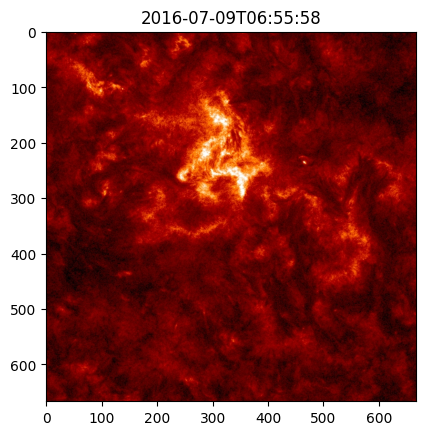

In [8]:
ani=main_plot(start_time,threshold)
# Display the animation as a clickable animation in the notebook
HTML(ani.to_jshtml())

In [9]:
import os, shutil
folder = './new_data'
for filename in os.listdir(folder):
    file_path = os.path.join(folder, filename)
    try:
        if os.path.isfile(file_path) or os.path.islink(file_path):
            os.unlink(file_path)
        elif os.path.isdir(file_path):
            shutil.rmtree(file_path)
    except Exception as e:
        print('Failed to delete %s. Reason: %s' % (file_path, e))

<div style="width: 1350px; height: 30px; background-color: green;"></div>
